In [8]:

import pandas as pd                         # for data manipulation and analysis
import numpy as np                          # for scientific computing
import seaborn as sns                       # for data visualization
import matplotlib.pyplot as plt             # for data visualization
import nltk                                 # for natural language processing
from nltk.tokenize import word_tokenize     # for tokenizing strings
from nltk.corpus import stopwords           # for stopwords
from nltk.probability import FreqDist       # for frequency distribution
from bs4 import BeautifulSoup               # for removing html tags
import re                                   # for regular expressions
from langdetect import detect               # for detecting language
import emoji                                # for emojis
from wordcloud import WordCloud             # for wordcloud
from collections import Counter             # for counting

In [12]:
import pandas as pd
import os
script_dir = os.path.dirname(os.path.realpath('__file__'))

# Combine the script directory with the file name
file_path = os.path.join(script_dir, 'output.csv')
df = pd.read_csv(file_path)

In [13]:
df.head(5)

,link,title,content
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,Sections Shows More Follow today More Brands O...
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,Sections Shows More Follow today More Brands O...
2,https://www.today.com/health/womens-health/ob-...,OB-GYNs share 7 things they never do when it c...,Sections Shows More Follow today More Brands T...
3,https://www.today.com/popculture/jodie-turner-...,Jodie Turner-Smith files for divorce from Josh...,Sections Shows More Follow today More Brands J...
4,https://www.today.com/parents/how-old-too-old-...,How old is too old to trick or treat?,Sections Shows More Follow today More Brands H...


In [87]:
#check python version
import sys
print(sys.version)

3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]


### **DATA UNDERSTANDING**

In [88]:
df.head(2)

,link,title,content
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,Sections Shows More Follow today More Brands O...
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,Sections Shows More Follow today More Brands O...


In [89]:
print(df.info())
print("----------------------------------------------------")
print("Type of columns:")
print(df.dtypes)
print("----------------------------------------------------")
print("Shape of the dataframe:")
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1190 entries, 0 to 1189
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   link     1190 non-null   object
 1   title    1190 non-null   object
 2   content  1190 non-null   object
dtypes: object(3)
memory usage: 28.0+ KB
None
----------------------------------------------------
Type of columns:
link       object
title      object
content    object
dtype: object
----------------------------------------------------
Shape of the dataframe:


(1190, 3)

In [90]:
# Printing the number of unique values
print("Total number of unique values in each column")
print(df.nunique())
print("----------------------------------------------------")
# Printing the number of missing values
print("Total number of missing values in each column is: ")
print(df.isnull().sum())

Total number of unique values in each column
link       1190
title      1189
content    1187
dtype: int64
----------------------------------------------------
Total number of missing values in each column is: 
link       0
title      0
content    0
dtype: int64


In [91]:
# Finding duplicate rows in title column and printing the number of duplicate rows
print("Number of duplicate rows in link column is: ")
print(df.duplicated(subset=['link']).sum())
print("----------------------------------------------------")
print("Number of duplicate rows in content column is: ")
print(df.duplicated(subset=['content']).sum())
print("----------------------------------------------------")
print("Number of duplicate rows in title column is: ")
print(df.duplicated(subset=['title']).sum())

Number of duplicate rows in link column is: 
0
----------------------------------------------------
Number of duplicate rows in content column is: 
3
----------------------------------------------------
Number of duplicate rows in title column is: 
1


In [92]:
#Drop diplicate rows if the content is same
df.drop_duplicates(subset=['content'], inplace=True)

In [93]:
df["link"]

0       https://www.today.com/food/news/applebees-doll...
1       https://www.today.com/popculture/tv/love-is-bl...
2       https://www.today.com/health/womens-health/ob-...
3       https://www.today.com/popculture/jodie-turner-...
4       https://www.today.com/parents/how-old-too-old-...
                              ...                        
1185    https://www.today.com/news/onewheel-electric-s...
1186    https://www.today.com/popculture/music/beyonce...
1187    https://www.today.com/news/powerball-no-winner...
1188    https://www.today.com/popculture/travis-kelce-...
1189    https://www.today.com/popculture/music/stevie-...
Name: link, Length: 1187, dtype: object

In [94]:
# Creating a category column
df['category'] = df['link'].apply(lambda x: x.split('https://www.today.com/')[1].split('/')[0] if 'https://www.today.com/' in x else 'Unknown')

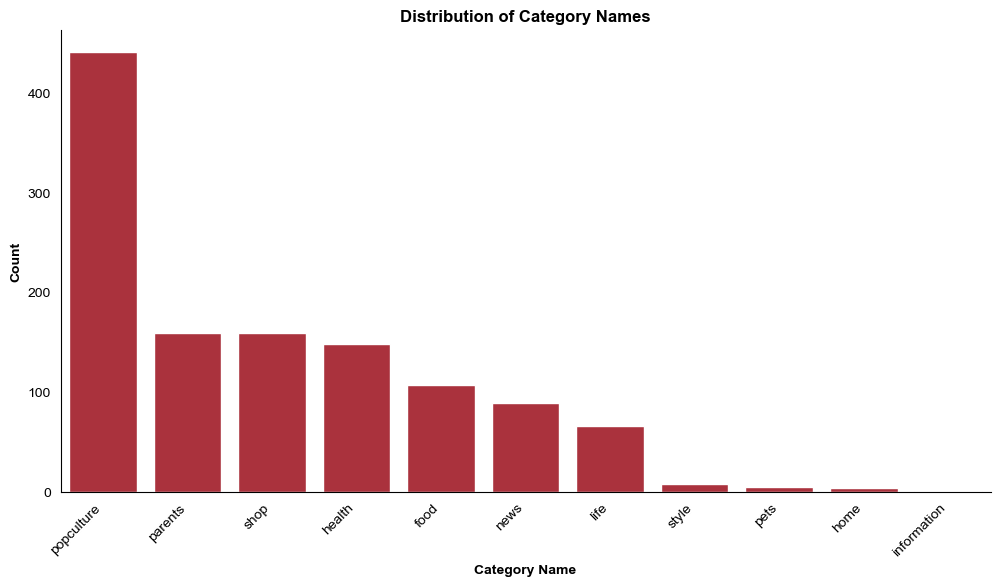

In [95]:
# Visualising the distribution of category names
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=df, x='category', order=df['category'].value_counts().index, color='#BE1E2D')
ax.set_title('Distribution of Category Names', color='Black', fontweight='bold')  # Title color
ax.set_xlabel('Category Name', color='black', fontweight='bold')  # X-axis label color
ax.set_ylabel('Count', color='black', fontweight='bold')  # Y-axis label color
ax.tick_params(axis='x', colors='black')  # X-axis tick labels color
ax.set_facecolor('white')  # Background color

# Remove the frame but keep the x-axis and y-axis
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
# Change x and y axis to white
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')

# Set color of x-axis tick labels to black
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')

# Set background color
fig = plt.gcf()
fig.set_facecolor('white')

plt.xticks(rotation=45, ha="right")  # X-axis tick rotation
plt.show()


In [96]:
# Adding new columns named "title_length" and "content_length" to the dataframe
df['title_length'] = df['title'].apply(len)
df['content_length'] = df['content'].apply(len)
df.head(2)

,link,title,content,category,title_length,content_length
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,Sections Shows More Follow today More Brands O...,food,69,2677
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,Sections Shows More Follow today More Brands O...,popculture,94,4659


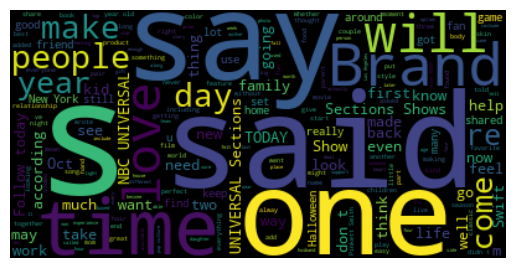

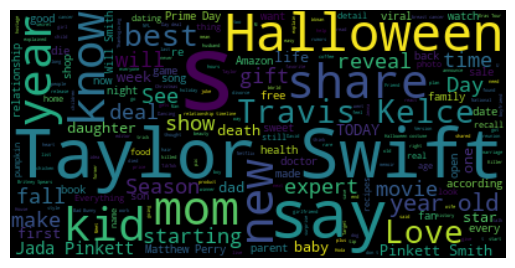

In [97]:
# Visualising most frequent words in the content column
wordcloud_content = WordCloud().generate(' '.join(df['content']))
plt.imshow(wordcloud_content, interpolation='bilinear')
plt.axis('off')
plt.show()

# Visualising most frequent words in the title column
wordcloud_title = WordCloud().generate(' '.join(df['title']))
plt.imshow(wordcloud_title, interpolation='bilinear')
plt.axis('off')
plt.show()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\MehmetCemAkuras\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


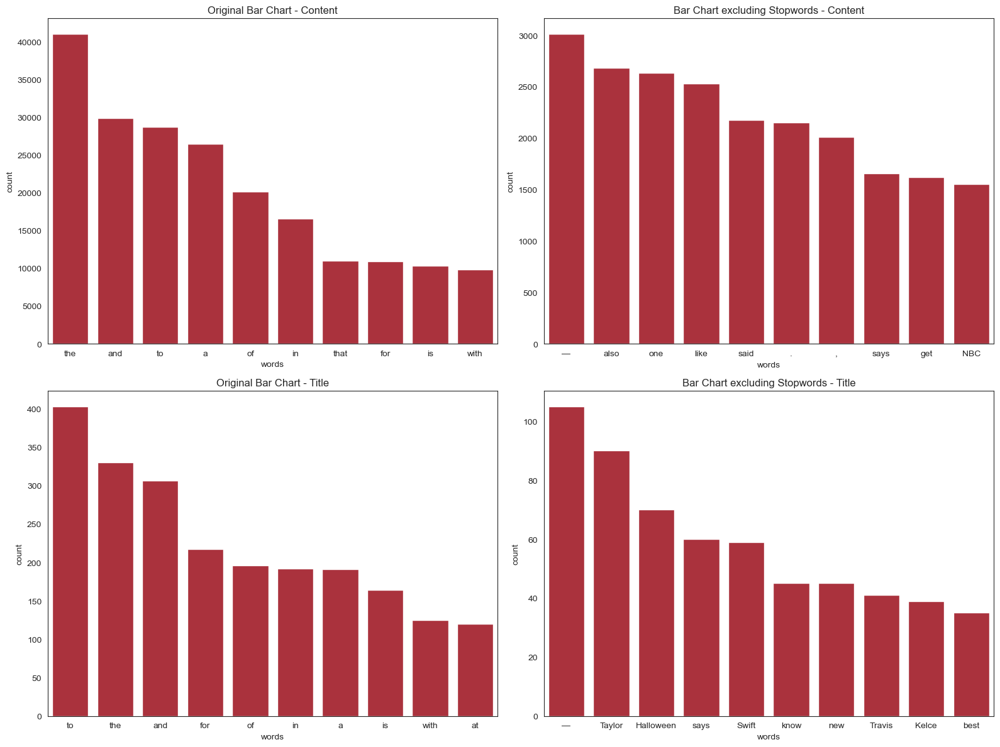

In [100]:
# Download the NLTK stopwords if not already downloaded
nltk.download('stopwords')

# Get the list of English stopwords
stop_words = set(stopwords.words('english'))

# Script 1: Original bar chart for "content" column
cnt1_content = Counter()
for text in df["content"].values:
    for word in text.split():
        cnt1_content[word] += 1

most_common_words1_content = cnt1_content.most_common(10)
most_common_words_df1_content = pd.DataFrame(most_common_words1_content, columns=['words', 'count'])

# Script 2: Bar chart excluding stopwords for "content" column
cnt2_content = Counter()
for text in df["content"].values:
    for word in text.split():
        if word.lower() not in stop_words:
            cnt2_content[word] += 1

most_common_words2_content = cnt2_content.most_common(10)
most_common_words_df2_content = pd.DataFrame(most_common_words2_content, columns=['words', 'count'])

# Script 3: Original bar chart for "title" column
cnt1_title = Counter()
for text in df["title"].values:
    for word in text.split():
        cnt1_title[word] += 1

most_common_words1_title = cnt1_title.most_common(10)
most_common_words_df1_title = pd.DataFrame(most_common_words1_title, columns=['words', 'count'])

# Script 4: Bar chart excluding stopwords for "title" column
cnt2_title = Counter()
for text in df["title"].values:
    for word in text.split():
        if word.lower() not in stop_words:
            cnt2_title[word] += 1

most_common_words2_title = cnt2_title.most_common(10)
most_common_words_df2_title = pd.DataFrame(most_common_words2_title, columns=['words', 'count'])

# Plotting side by side
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot for Script 1 - Content
sns.barplot(x="words", y="count", data=most_common_words_df1_content, color="#BE1E2D", ax=axes[0, 0])
axes[0, 0].set_title('Original Bar Chart - Content')

# Plot for Script 2 - Content
sns.barplot(x="words", y="count", data=most_common_words_df2_content, color="#BE1E2D", ax=axes[0, 1])
axes[0, 1].set_title('Bar Chart excluding Stopwords - Content')

# Plot for Script 3 - Title
sns.barplot(x="words", y="count", data=most_common_words_df1_title, color="#BE1E2D", ax=axes[1, 0])
axes[1, 0].set_title('Original Bar Chart - Title')

# Plot for Script 4 - Title
sns.barplot(x="words", y="count", data=most_common_words_df2_title, color="#BE1E2D", ax=axes[1, 1])
axes[1, 1].set_title('Bar Chart excluding Stopwords - Title')

plt.tight_layout()
plt.show()


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\MehmetCemAkuras\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


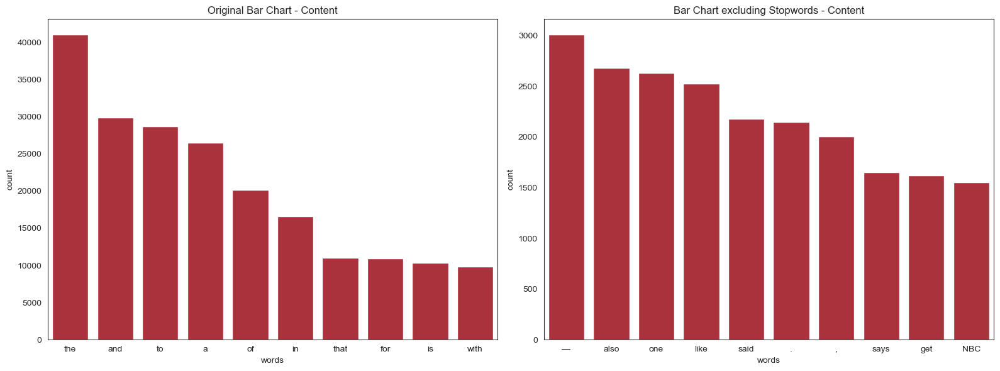

In [102]:
import nltk
from nltk.corpus import stopwords
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Download the NLTK stopwords if not already downloaded
nltk.download('stopwords')

# Get the list of English stopwords
stop_words = set(stopwords.words('english'))

# Assuming df is your DataFrame

# Script 1: Original bar chart for "content" column
cnt1_content = Counter()
for text in df["content"].values:
    for word in text.split():
        cnt1_content[word] += 1

most_common_words1_content = cnt1_content.most_common(10)
most_common_words_df1_content = pd.DataFrame(most_common_words1_content, columns=['words', 'count'])

# Script 2: Bar chart excluding stopwords for "content" column
cnt2_content = Counter()
for text in df["content"].values:
    for word in text.split():
        if word.lower() not in stop_words:
            cnt2_content[word] += 1

most_common_words2_content = cnt2_content.most_common(10)
most_common_words_df2_content = pd.DataFrame(most_common_words2_content, columns=['words', 'count'])

# Plotting side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot for Script 1 - Content
sns.barplot(x="words", y="count", data=most_common_words_df1_content, color="#BE1E2D", ax=axes[0])
axes[0].set_title('Original Bar Chart - Content')

# Plot for Script 2 - Content
sns.barplot(x="words", y="count", data=most_common_words_df2_content, color="#BE1E2D", ax=axes[1])
axes[1].set_title('Bar Chart excluding Stopwords - Content')

plt.tight_layout()
plt.show()


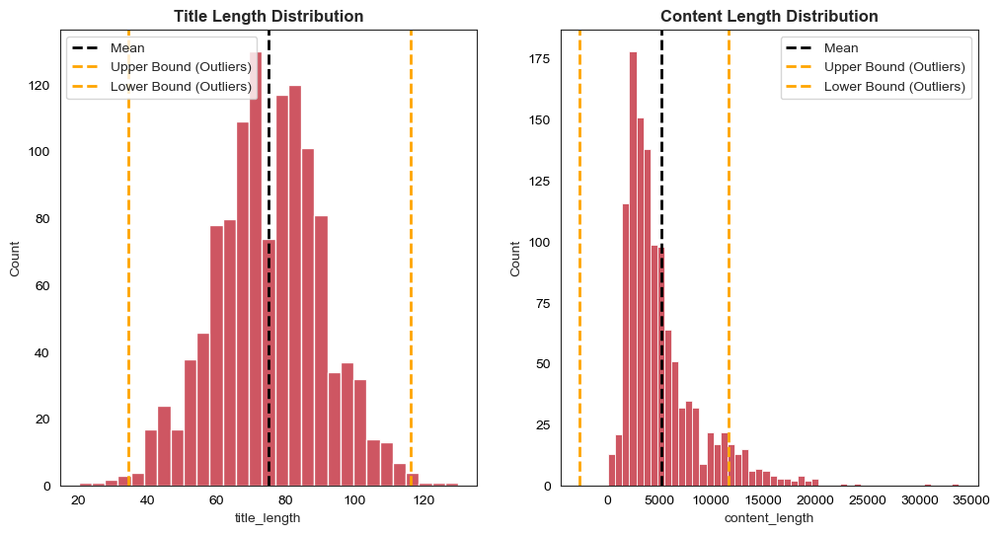

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline
sns.set_style('white')

# Assuming df is your DataFrame
# Calculate IQR for title_length and content_length
title_length_iqr = np.percentile(df['title_length'], 75) - np.percentile(df['title_length'], 25)
content_length_iqr = np.percentile(df['content_length'], 75) - np.percentile(df['content_length'], 25)

# Define the upper and lower bounds for outliers
title_length_upper_bound = np.percentile(df['title_length'], 75) + 1.5 * title_length_iqr
title_length_lower_bound = np.percentile(df['title_length'], 25) - 1.5 * title_length_iqr

content_length_upper_bound = np.percentile(df['content_length'], 75) + 1.5 * content_length_iqr
content_length_lower_bound = np.percentile(df['content_length'], 25) - 1.5 * content_length_iqr

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
ax1 = sns.histplot(df['title_length'], color='#BE1E2D')
ax1.axvline(df['title_length'].mean(), color='black', linestyle='dashed', linewidth=2, label='Mean')
ax1.axvline(title_length_upper_bound, color='orange', linestyle='dashed', linewidth=2, label='Upper Bound (Outliers)')
ax1.axvline(title_length_lower_bound, color='orange', linestyle='dashed', linewidth=2, label='Lower Bound (Outliers)')
ax1.set_title('Title Length Distribution', fontweight='bold')
ax1.legend(loc='upper left')  # Move legend to the top-left corner
ax1.tick_params(axis='x', colors='black')
ax1.tick_params(axis='y', colors='black')

plt.subplot(1, 2, 2)
ax2 = sns.histplot(df['content_length'], color='#BE1E2D')
ax2.axvline(df['content_length'].mean(), color='black', linestyle='dashed', linewidth=2, label='Mean')
ax2.axvline(content_length_upper_bound, color='orange', linestyle='dashed', linewidth=2, label='Upper Bound (Outliers)')
ax2.axvline(content_length_lower_bound, color='orange', linestyle='dashed', linewidth=2, label='Lower Bound (Outliers)')
ax2.set_title('Content Length Distribution', fontweight='bold')
ax2.legend()
ax2.tick_params(axis='x', colors='black')
ax2.tick_params(axis='y', colors='black')

plt.show()


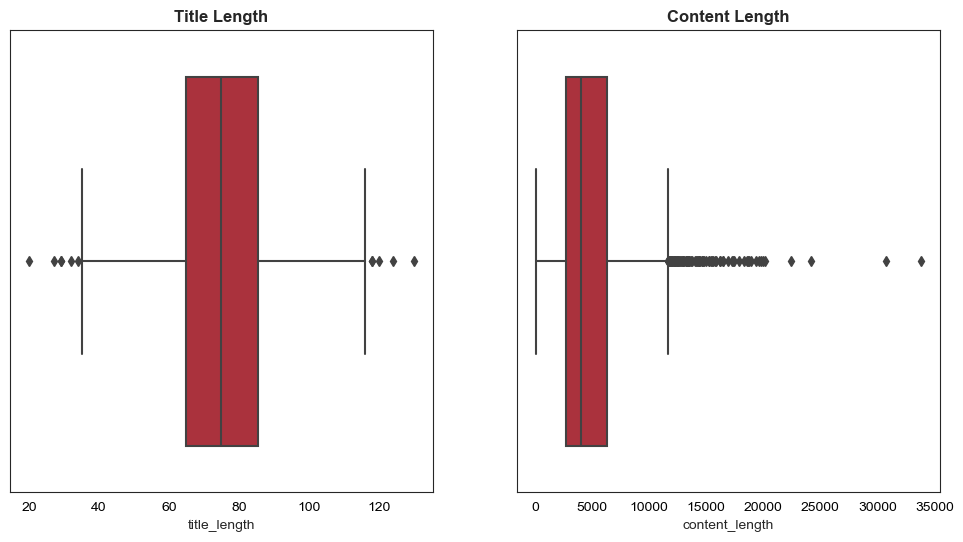

----------------------------------------------------
Number of outliers in title_length: 11
Number of outliers in content_length: 87


In [63]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
ax1 = sns.boxplot(x=df['title_length'], color='#BE1E2D')
ax1.set_title('Title Length', fontweight='bold')
ax1.tick_params(axis='x', colors='black')
ax1.tick_params(axis='y', colors='black')

plt.subplot(1, 2, 2)
ax2 = sns.boxplot(x=df['content_length'], color='#BE1E2D')
ax2.set_title('Content Length', fontweight='bold')
ax2.tick_params(axis='x', colors='black')
ax2.tick_params(axis='y', colors='black')

plt.show()


print('----------------------------------------------------')

#Print the number of outliers in title_length and content_length
print('Number of outliers in title_length: {}'.format(len(df[df['title_length'] > title_length_upper_bound]) + len(df[df['title_length'] < title_length_lower_bound])))
print('Number of outliers in content_length: {}'.format(len(df[df['content_length'] > content_length_upper_bound]) + len(df[df['content_length'] < content_length_lower_bound])))

In [17]:
df.head(2)

,link,title,content,category,title_length,content_length
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,Sections Shows More Follow today More Brands O...,food,69,2677
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,Sections Shows More Follow today More Brands O...,popculture,94,4659


### **DATA CLEANING**

In [18]:
df_to_clean = df.copy()
df_to_clean.head(5)

# code to remove a particular substring from the content column
substring_to_remove = 'Sections Shows More Follow Today More Brands'
df_to_clean['cleaned_content'] = df_to_clean['content'].str.replace(substring_to_remove, '', case=False)
df_to_clean

,link,title,content,category,title_length,content_length,cleaned_content
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,Sections Shows More Follow today More Brands O...,food,69,2677,"October is the start of spooky season, so one..."
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,Sections Shows More Follow today More Brands O...,popculture,94,4659,Only two couples remained on Season Five of “...
2,https://www.today.com/health/womens-health/ob-...,OB-GYNs share 7 things they never do when it c...,Sections Shows More Follow today More Brands T...,health,68,5651,There's not much you need to do to keep your ...
3,https://www.today.com/popculture/jodie-turner-...,Jodie Turner-Smith files for divorce from Josh...,Sections Shows More Follow today More Brands J...,popculture,56,2229,Jodie Turner-Smith has filed for divorce from...
4,https://www.today.com/parents/how-old-too-old-...,How old is too old to trick or treat?,Sections Shows More Follow today More Brands H...,parents,37,4806,How old is on ? Are teenagers too old to tr...
...,...,...,...,...,...,...,...
1185,https://www.today.com/news/onewheel-electric-s...,Onewheel electric skateboards recalled after 4...,Sections Shows More Follow today More Brands H...,news,73,2002,Hundreds of thousands of Onewheel electric sk...
1186,https://www.today.com/popculture/music/beyonce...,Tina Knowles praises Beyoncé and Taylor Swift ...,Sections Shows More Follow today More Brands T...,popculture,106,3761,Tina Knowles is celebrating — Beyoncé’s “Re...
1187,https://www.today.com/news/powerball-no-winner...,"Powerball draw produces no winners, pushing ja...",Sections Shows More Follow today More Brands S...,news,67,866,Saturday night’s Powerball lottery draw took ...
1188,https://www.today.com/popculture/travis-kelce-...,Travis Kelce and Chiefs hilariously trade Swif...,Sections Shows More Follow today More Brands A...,popculture,79,3121,Ahead of the team's matchup against the New Y...


In [19]:
# dropping the content column which is not cleaned
col_to_drop = ['content']
df_to_clean.drop(columns=col_to_drop,inplace=True)
df_to_clean

,link,title,category,title_length,content_length,cleaned_content
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,food,69,2677,"October is the start of spooky season, so one..."
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,popculture,94,4659,Only two couples remained on Season Five of “...
2,https://www.today.com/health/womens-health/ob-...,OB-GYNs share 7 things they never do when it c...,health,68,5651,There's not much you need to do to keep your ...
3,https://www.today.com/popculture/jodie-turner-...,Jodie Turner-Smith files for divorce from Josh...,popculture,56,2229,Jodie Turner-Smith has filed for divorce from...
4,https://www.today.com/parents/how-old-too-old-...,How old is too old to trick or treat?,parents,37,4806,How old is on ? Are teenagers too old to tr...
...,...,...,...,...,...,...
1185,https://www.today.com/news/onewheel-electric-s...,Onewheel electric skateboards recalled after 4...,news,73,2002,Hundreds of thousands of Onewheel electric sk...
1186,https://www.today.com/popculture/music/beyonce...,Tina Knowles praises Beyoncé and Taylor Swift ...,popculture,106,3761,Tina Knowles is celebrating — Beyoncé’s “Re...
1187,https://www.today.com/news/powerball-no-winner...,"Powerball draw produces no winners, pushing ja...",news,67,866,Saturday night’s Powerball lottery draw took ...
1188,https://www.today.com/popculture/travis-kelce-...,Travis Kelce and Chiefs hilariously trade Swif...,popculture,79,3121,Ahead of the team's matchup against the New Y...


In [20]:
# printing the values
print(df_to_clean.values)

[['https://www.today.com/food/news/applebees-dollarita-returns-rcna118096'
  'Applebee’s brings back fan-favorite menu item after more than 3 years'
  'food' 69 2677
  ' October is the start of spooky season, so one casual dining chain is getting  -zy by bringing back a customer-favorite drink special. On Oct. 1, Applebee’s announced its world-famous Dollarita is returning after a three-year hiatus for a limited time. That’s right: An adult beverage at Applebee’s is going for a single dollar in the age of $20 cocktails. Starting today, guests who are 21+ can enjoy the Dollarita, a $1 margarita made with tequila, triple sec and lime.  According to  , the Dollarita “will have Neighborhoods throughout the country buzzin’ with excitement all month long,” though folks with a five spot burning a hole in their pocket will likely go beyond buzzin’. “After more than three years of listening to guests in-restaurant and on social tell the brand how much they miss the Dollarita® it is finally back

In [21]:
# function to remove special characters, emojis, non-breaking space and non-alphanumeric symbols
import re
import emoji
import pandas as pd

def clean_text(text):
    # Remove special characters, emojis, non-alphanumeric symbols, and non-breaking space
    #cleaned_text = re.sub(r'[^a-zA-Z0-9\s.]', '', text)
    cleaned_text = re.sub(r'[\xa0]', ' ',text)
    cleaned_text = emoji.get_emoji_regexp().sub('', cleaned_text)
    return cleaned_text


df_to_clean['cleaned_text'] = df_to_clean['cleaned_content'].apply(clean_text)

# Display the cleaned DataFrame
print(df_to_clean[['cleaned_content', 'cleaned_text']].values)

[[' October is the start of spooky season, so one casual dining chain is getting  -zy by bringing back a customer-favorite drink special. On Oct. 1, Applebee’s announced its world-famous Dollarita is returning after a three-year hiatus for a limited time. That’s right: An adult beverage at Applebee’s is going for a single dollar in the age of $20 cocktails. Starting today, guests who are 21+ can enjoy the Dollarita, a $1 margarita made with tequila, triple sec and lime.  According to  , the Dollarita “will have Neighborhoods throughout the country buzzin’ with excitement all month long,” though folks with a five spot burning a hole in their pocket will likely go beyond buzzin’. “After more than three years of listening to guests in-restaurant and on social tell the brand how much they miss the Dollarita® it is finally back!” an Applebee’s spokesperson tells TODAY.com via email. That’s not just lip service, either. The last time the Dollarita was officially brought back nationwide, afte

In [22]:
# code to remove a particular substring from the content column
substring_to_remove = '2023 NBC UNIVERSAL'
df_to_clean['cleaned_text'] = df_to_clean['cleaned_text'].str.replace(substring_to_remove, '', case=False)
print(df_to_clean[['cleaned_content', 'cleaned_text']].values)

[[' October is the start of spooky season, so one casual dining chain is getting  -zy by bringing back a customer-favorite drink special. On Oct. 1, Applebee’s announced its world-famous Dollarita is returning after a three-year hiatus for a limited time. That’s right: An adult beverage at Applebee’s is going for a single dollar in the age of $20 cocktails. Starting today, guests who are 21+ can enjoy the Dollarita, a $1 margarita made with tequila, triple sec and lime.  According to  , the Dollarita “will have Neighborhoods throughout the country buzzin’ with excitement all month long,” though folks with a five spot burning a hole in their pocket will likely go beyond buzzin’. “After more than three years of listening to guests in-restaurant and on social tell the brand how much they miss the Dollarita® it is finally back!” an Applebee’s spokesperson tells TODAY.com via email. That’s not just lip service, either. The last time the Dollarita was officially brought back nationwide, afte

In [23]:
df_to_clean

,link,title,category,title_length,content_length,cleaned_content,cleaned_text
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,food,69,2677,"October is the start of spooky season, so one...","October is the start of spooky season, so one..."
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,popculture,94,4659,Only two couples remained on Season Five of “...,Only two couples remained on Season Five of “...
2,https://www.today.com/health/womens-health/ob-...,OB-GYNs share 7 things they never do when it c...,health,68,5651,There's not much you need to do to keep your ...,There's not much you need to do to keep your ...
3,https://www.today.com/popculture/jodie-turner-...,Jodie Turner-Smith files for divorce from Josh...,popculture,56,2229,Jodie Turner-Smith has filed for divorce from...,Jodie Turner-Smith has filed for divorce from...
4,https://www.today.com/parents/how-old-too-old-...,How old is too old to trick or treat?,parents,37,4806,How old is on ? Are teenagers too old to tr...,How old is on ? Are teenagers too old to tr...
...,...,...,...,...,...,...,...
1185,https://www.today.com/news/onewheel-electric-s...,Onewheel electric skateboards recalled after 4...,news,73,2002,Hundreds of thousands of Onewheel electric sk...,Hundreds of thousands of Onewheel electric sk...
1186,https://www.today.com/popculture/music/beyonce...,Tina Knowles praises Beyoncé and Taylor Swift ...,popculture,106,3761,Tina Knowles is celebrating — Beyoncé’s “Re...,Tina Knowles is celebrating — Beyoncé’s “Re...
1187,https://www.today.com/news/powerball-no-winner...,"Powerball draw produces no winners, pushing ja...",news,67,866,Saturday night’s Powerball lottery draw took ...,Saturday night’s Powerball lottery draw took ...
1188,https://www.today.com/popculture/travis-kelce-...,Travis Kelce and Chiefs hilariously trade Swif...,popculture,79,3121,Ahead of the team's matchup against the New Y...,Ahead of the team's matchup against the New Y...


In [24]:
col_to_drop = ['cleaned_content']
df_to_clean.drop(columns=col_to_drop,inplace=True)
print(df_to_clean.values)

[['https://www.today.com/food/news/applebees-dollarita-returns-rcna118096'
  'Applebee’s brings back fan-favorite menu item after more than 3 years'
  'food' 69 2677
  ' October is the start of spooky season, so one casual dining chain is getting  -zy by bringing back a customer-favorite drink special. On Oct. 1, Applebee’s announced its world-famous Dollarita is returning after a three-year hiatus for a limited time. That’s right: An adult beverage at Applebee’s is going for a single dollar in the age of $20 cocktails. Starting today, guests who are 21+ can enjoy the Dollarita, a $1 margarita made with tequila, triple sec and lime.  According to  , the Dollarita “will have Neighborhoods throughout the country buzzin’ with excitement all month long,” though folks with a five spot burning a hole in their pocket will likely go beyond buzzin’. “After more than three years of listening to guests in-restaurant and on social tell the brand how much they miss the Dollarita it is finally back!

In [25]:
#final cleaned data
df_to_clean

,link,title,category,title_length,content_length,cleaned_text
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,food,69,2677,"October is the start of spooky season, so one..."
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,popculture,94,4659,Only two couples remained on Season Five of “...
2,https://www.today.com/health/womens-health/ob-...,OB-GYNs share 7 things they never do when it c...,health,68,5651,There's not much you need to do to keep your ...
3,https://www.today.com/popculture/jodie-turner-...,Jodie Turner-Smith files for divorce from Josh...,popculture,56,2229,Jodie Turner-Smith has filed for divorce from...
4,https://www.today.com/parents/how-old-too-old-...,How old is too old to trick or treat?,parents,37,4806,How old is on ? Are teenagers too old to tr...
...,...,...,...,...,...,...
1185,https://www.today.com/news/onewheel-electric-s...,Onewheel electric skateboards recalled after 4...,news,73,2002,Hundreds of thousands of Onewheel electric sk...
1186,https://www.today.com/popculture/music/beyonce...,Tina Knowles praises Beyoncé and Taylor Swift ...,popculture,106,3761,Tina Knowles is celebrating — Beyoncé’s “Re...
1187,https://www.today.com/news/powerball-no-winner...,"Powerball draw produces no winners, pushing ja...",news,67,866,Saturday night’s Powerball lottery draw took ...
1188,https://www.today.com/popculture/travis-kelce-...,Travis Kelce and Chiefs hilariously trade Swif...,popculture,79,3121,Ahead of the team's matchup against the New Y...


In [26]:
#final cleaned data (expanded)
df_to_clean['cleaned_text'].values

array([' October is the start of spooky season, so one casual dining chain is getting  -zy by bringing back a customer-favorite drink special. On Oct. 1, Applebee’s announced its world-famous Dollarita is returning after a three-year hiatus for a limited time. That’s right: An adult beverage at Applebee’s is going for a single dollar in the age of $20 cocktails. Starting today, guests who are 21+ can enjoy the Dollarita, a $1 margarita made with tequila, triple sec and lime.  According to  , the Dollarita “will have Neighborhoods throughout the country buzzin’ with excitement all month long,” though folks with a five spot burning a hole in their pocket will likely go beyond buzzin’. “After more than three years of listening to guests in-restaurant and on social tell the brand how much they miss the Dollarita it is finally back!” an Applebee’s spokesperson tells TODAY.com via email. That’s not just lip service, either. The last time the Dollarita was officially brought back nationwide, 

SPLITTING THE CLEANED TEXT INTO PARAGRAPHS FOR SUMMARISATION

In [27]:
# Function to split text into paragraphs based on full stops
def split_into_paragraphs(text):
    return re.split(r'\.\s+', text)

# Apply the function to the 'cleaned_text' and create a new column 'paragraphs'
df_to_clean['paragraphs'] = df_to_clean['cleaned_text'].apply(split_into_paragraphs)

# Display the result
#print(df_to_clean[['cleaned_text', 'paragraphs']].values)



In [28]:
# Print each paragraph
for index, row in df_to_clean.iterrows():
    print(f"Paragraphs for index {index + 1}:")
    for i, paragraph in enumerate(row['paragraphs'], 1):
        print(f"  {i}. {paragraph}")
    print()

Paragraphs for index 1:
  1.  October is the start of spooky season, so one casual dining chain is getting  -zy by bringing back a customer-favorite drink special
  2. On Oct
  3. 1, Applebee’s announced its world-famous Dollarita is returning after a three-year hiatus for a limited time
  4. That’s right: An adult beverage at Applebee’s is going for a single dollar in the age of $20 cocktails
  5. Starting today, guests who are 21+ can enjoy the Dollarita, a $1 margarita made with tequila, triple sec and lime
  6. According to  , the Dollarita “will have Neighborhoods throughout the country buzzin’ with excitement all month long,” though folks with a five spot burning a hole in their pocket will likely go beyond buzzin’
  7. “After more than three years of listening to guests in-restaurant and on social tell the brand how much they miss the Dollarita it is finally back!” an Applebee’s spokesperson tells TODAY.com via email
  8. That’s not just lip service, either
  9. The last time th

  42. Claus in "The Rockettes' Radio City Christmas Spectacular," but now she mostly sings songs from "Annie" to her two daughters … while they beg her to play Kidz Bop
  43. 

Paragraphs for index 79:
  1.  The Food and Drug Administration on Monday expanded its warning not to buy or use eyedrops sold by several major retailers, sometimes under their own brand names
  2. The warning now includes the product Equate Hydration PF Lubricant Eye Drop 10 mL sold by Walmart, the FDA said
  3. “Walmart is removing the product from their store shelves and website,” it said in an updated drug safety warning
  4. A   published under the FDA’s warning also includes those sold under the brands CVS Health, Leader, Rugby, Rite Aid, Target Up & Up and Velocity Pharma
  5. The agency said retailers should pull them from shelves and consumers should discard them
  6. Besides Walmart’s noted cooperation, the FDA said CVS, Target and Rite Aid were pulling the eyedrops from shelves and making them unavail

In [29]:
# Function to split text into paragraphs based on character size (2500 characters = 500 tokens)

def split_into_paragraphs(text, max_chars_per_paragraph=2500):
    paragraphs = []
    current_paragraph = ""

    for word in text.split():
        if len(current_paragraph) + len(word) + 1 <= max_chars_per_paragraph:
            current_paragraph += word + " "
        else:
            paragraphs.append(current_paragraph.strip())
            current_paragraph = word + " "

    if current_paragraph:
        paragraphs.append(current_paragraph.strip())

    return paragraphs


# Apply the function to the 'cleaned_text' and create a new column 'paragraphs'
df_to_clean['paragraphs'] = df_to_clean['cleaned_text'].apply(split_into_paragraphs)

# Display the result
for index, row in df_to_clean.iterrows():
    print(f"Paragraphs for index {index + 1}:")
    for i, paragraph in enumerate(row['paragraphs'], 1):
        print(f"  {i}. {paragraph}")
    print()


Paragraphs for index 1:
  1. October is the start of spooky season, so one casual dining chain is getting -zy by bringing back a customer-favorite drink special. On Oct. 1, Applebee’s announced its world-famous Dollarita is returning after a three-year hiatus for a limited time. That’s right: An adult beverage at Applebee’s is going for a single dollar in the age of $20 cocktails. Starting today, guests who are 21+ can enjoy the Dollarita, a $1 margarita made with tequila, triple sec and lime. According to , the Dollarita “will have Neighborhoods throughout the country buzzin’ with excitement all month long,” though folks with a five spot burning a hole in their pocket will likely go beyond buzzin’. “After more than three years of listening to guests in-restaurant and on social tell the brand how much they miss the Dollarita it is finally back!” an Applebee’s spokesperson tells TODAY.com via email. That’s not just lip service, either. The last time the Dollarita was officially brought 